# ReMapping Blaueu's 1664 Terrarium Orbis


In [1]:
%matplotlib inline

import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from imageio import imread, imwrite
from copy import deepcopy

import uuid

In [2]:
blaueu1664 = imread('/Users/patrickfoley/map_projections/input_images/Blaeu_1664.jpg')

This is [Joan Blaueu's](https://en.wikipedia.org/wiki/Joan_Blaeu) 1664 Terrarium Orbis - a [stereographic projection](https://en.wikipedia.org/wiki/Stereographic_projection) with two hemishpheres.  Our goal here is to see if we can rotate it.  We might also try to remap the original artwork to a cylindrical projection.  

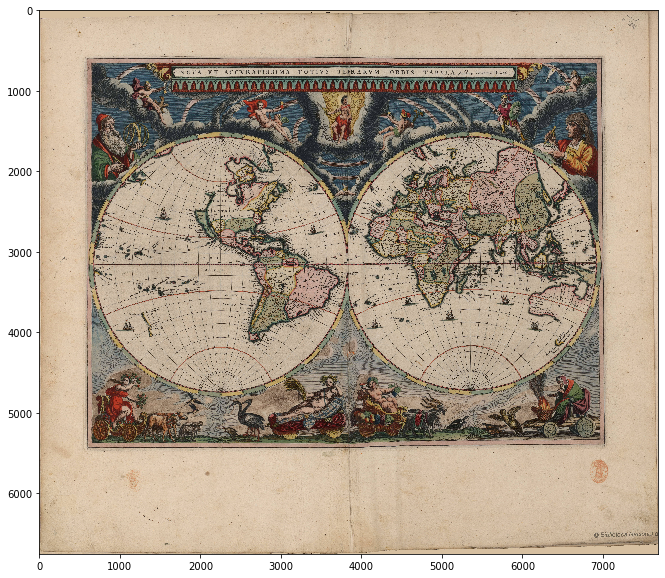

In [8]:
plt.figure(figsize=(14, 10))
plt.imshow(blaueu1664)

Let's try to crop it, and try to crop the circles. 

In [9]:
print(blaueu1664.shape)

(6751, 7686, 3)


In [10]:
cropped_blau = blaueu1664[600:5400, 600:7000, :]

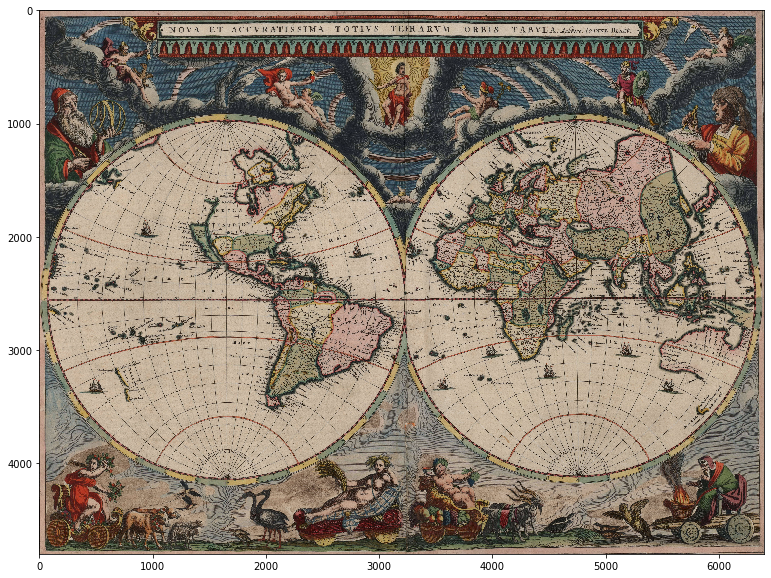

In [11]:
plt.figure(figsize=(14,10))
plt.imshow(cropped_blau)

Looks good!  Now let's get both hemispheres. 

In [12]:
def get_hemisphere(center, radius, base=cropped_blau):
    """Pulls a single hemisphere from a double hemisphere map.
    Center is (x,y) pixels, radius is in pixels.
    Start from cropped."""
    cx, cy = center
    assert cx > radius
    assert cy > radius
    nxbase, nybase, _ = base.shape
    assert nxbase - cx > radius
    assert nybase - cy > radius
    square = deepcopy(base[(cx-radius):(cx+radius), (cy-radius):(cy+radius), :])
    #  Need to make other pixels black.  Or maybe not.  
    #  square is now shape r, r, 3
    npix = 2*radius + 1
    xs, ys = np.meshgrid(np.arange(0, npix-1), np.arange(0, npix-1))
    out_of_circle = (xs - (npix/2))**2 + (ys-(npix/2))**2 > radius**2
    square[xs[out_of_circle], ys[out_of_circle], :] = 0
    return square


In [13]:
western_hemisphere = get_hemisphere((2560, 1650), 1575)

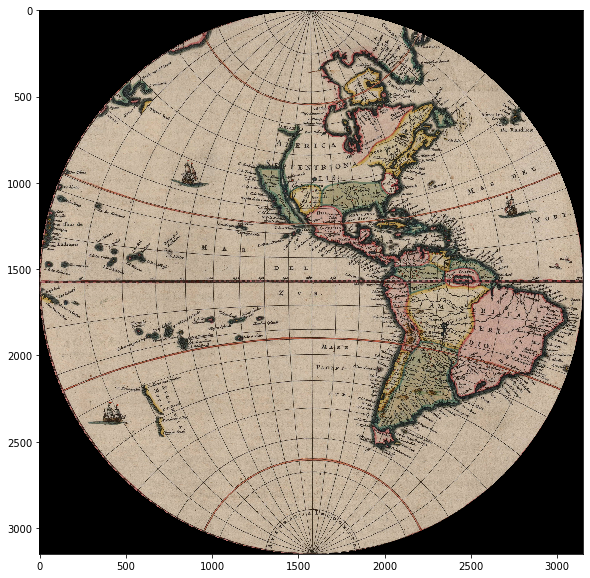

In [14]:
plt.figure(figsize=(10,10))
plt.imshow(western_hemisphere)

Let me find the hemispheres on a smaller image for faster prototyping.

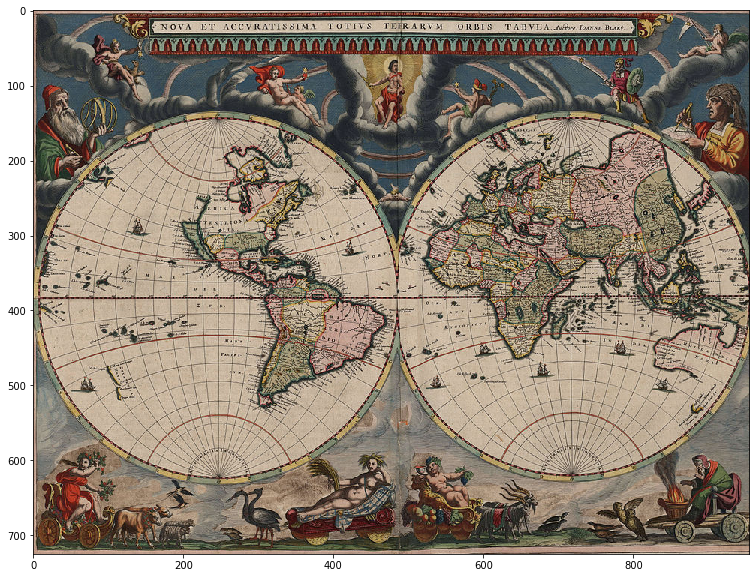

In [15]:
small_base_img = imread('/Users/patrickfoley/map_projections/blaueu_large.jpg')
small_cropped_blau = small_base_img[95:820, 95:1050, :]
plt.figure(figsize=(14,10))
plt.imshow(small_cropped_blau)

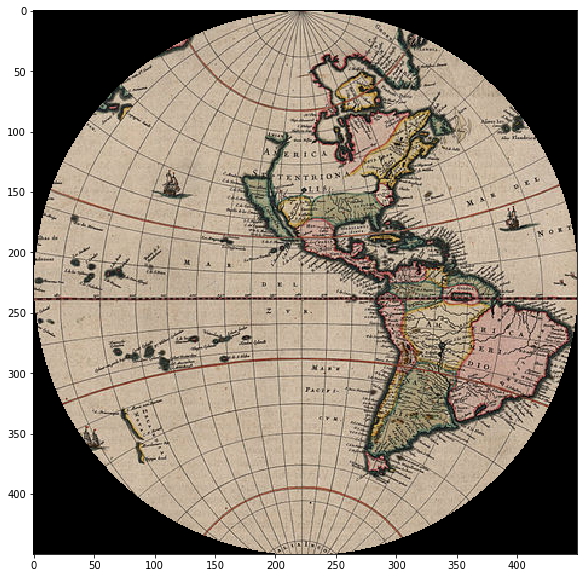

In [16]:
small_western_hemisphere = get_hemisphere((370, 250), 225, base=small_cropped_blau)
plt.figure(figsize=(10,10))
plt.imshow(small_western_hemisphere)

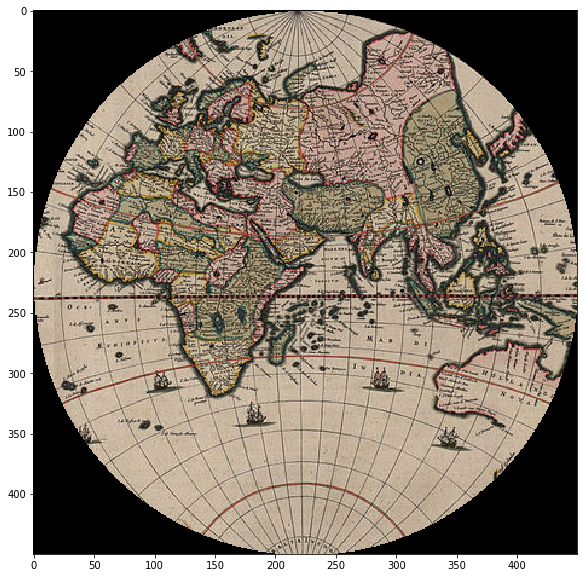

In [17]:
small_eastern_hemisphere = get_hemisphere((370, 720), 225, base=small_cropped_blau)
plt.figure(figsize=(10,10))
plt.imshow(small_eastern_hemisphere)
small_rad = 225

For the Eastern hemisphere, there is a bit of a crease in the actual image that we won't be able to avoid.  This is going to cause some distortions, but that's ok.

<img src="input_images/crease1.png" alt="Crease on Page" style="width: 200px;"/>
<img src="input_images/crease2.png" alt="Crease on Page" style="width: 200px;"/>

##  Mapping Pixels to Spatial Coordinates

[Wikipedia](https://en.wikipedia.org/wiki/Stereographic_projection
) gives us the transformations from positions on the unit sphere to pixels on the plane.




Using $(x, y, z)$ for the sphere, and $(u, v)$ for pixels on the plane, we have:

\begin{eqnarray}
(u, v) &=& (\frac{x}{1-z}, \frac{y}{1-z}) \\
\psi &=& u^2 + v^2 \\
(x, y, z) &=& (\frac{2 u}{1 + \psi}, \frac{2 v}{1 + \psi}, \frac{-1 + \psi}{1 + \psi}) \\
\end{eqnarray}

I believe this sets things up where positive z is the north pole of the maps on wikipeida (or the center of eastern hemisphere in Blaueu's map) and negative the south (western in Blaueu's).  

To rotate this map, we will need to manage the western and eastern hemispheres simultaneously.  For any rotation (specified by a rotation matrix $R$) we will need to:
  1.  transform our pixels u, v into positions on the sphere, x,y,z
  2.  rotate the spheres to get new positions x', y', z'
  3.  bring these back into pixel space to get u', v'
  4.  pull the RGB values of our new u', v'.

### Making a Mask / Array of Pixels

We will need some set of pixels to manipulate, which might be a bit tough.  We need to get an array of `(u, v)` s.t. `u**2 + v**2 <= r**2`.  We would like to center the hemisphere so it should appear to go from `[-r, -r]` at bottom left to `[r, r]` at top right. 

In [18]:
pixel_radius = 1575

Note that every time we index into the hemisphere image, we'll need to add back in the radius. 

Hm, another issue is that, in general, a sterographic projection can show more than a hemisphere.  Some maps use a sterographic projection and show a hemisphere + 30 or so degrees.


<img src="input_images/more_than_hemisphere.jpg" alt="[An example from Wikipedia w/ North pole at origin extending to 30* South" style="width: 240px;"/>

It might be cool to try to be able to display stereographics at arbitrary radii, but for now let's keep everything fixed to a double hemisphere image.  

We will also need to keep track of -1,1 values corresponding to southern (western in Blaueu) and northern (eastern in Blaueu) hemispheres.  We can think of $(u, v, H)$ as one set of coordinates (pixels and H for which hemisphere it is).  A lot of the trouble is just getting the transformations from $(u, v, H)$ to $(x, y, z)$ and back.

We first need to make some functions to transform pixels from image-display space to the more standard 2d spatial orientation.  This is just flipping and swapping some axes, but it's important to get it right.

In [23]:
def uv_to_st(u, v, radius=pixel_radius, debug=False):
    """Images are not arranged how I want.  This remaps them.
    This is really just swapping the axes and flipping one of them, but 
    it's tricky to get it right.  I want pixel values that look like an x and a y - 
    these are the new s and t.  The u and v are pixel values as used to display images.

    They start (call this u, v) with It is (y, x) and the top left is 0,0.
    top left      -  0, 0
    top right     -  0, N
    bottom left   -  N, 0
    bottom right  -  N, N
    these  also go 0 to 2r, 0 to 2r.
    
    I want to turn it into s, t like this:
      topleft     - 0, N
      topright    - N, N
      bottomleft  - 0, 0
      bottomright - N, 0
    These will be from 0 to r.
      
    pixels are [s, t, rgb]
    then x, y is [u, v, rgb]"""
    if debug:
        print(f' in uv to st, range of u is {min(u)} to {max(u)}'
              f'and range of v is {min(v)} to {max(v)}')

    s = v - radius
    t = radius - u
    if debug:
        print(f'range of s is {min(s)} to {max(s)}'
              f'and range of t is {min(t)} to {max(t)}')
    
    return s, t

In [22]:
def st_to_uv(s, t, radius = pixel_radius, debug=False):
    """This maps s and t (spatial 2d x and y) back to pixel values for image display.
    """
    if debug:
        print(f' in st to uv, range of s is {min(s)} to {max(s)}'
              f' and range of t is {min(t)} to {max(t)}')

    # 12/28/18 - DO NOT CHANGE THESE.
    # Flipping the sign on the t and s will flip the output maps. 
    u = radius + t # neither should this
    v = radius - s  #. ????  this should not work...  #removed it?
    if debug:
        print(f'range of u is {min(u)} to {max(u)}'
              f'and range of v is {min(v)} to {max(v)}')

    return u, v

Now we can map from image space to 2d space.  Next we need to go from 2d space to 3d positions on the sphere.

In [24]:
def st_to_xyz(s, t, NS, radius, debug=False):
    """Spatial coordinates on unit sphere from pixel values and 
    map radius for a centered stereographic projection. Sterographic
    projection map is taken to go -r to r in pixels.
    
    s is -r to r, 
    t is -r to r
    NS is -1 (southern hem wikipedia, western hemisphere in Blaueu) or 1(northern, eastern)
    -r,-r is bottom left, r,r is top right.
    """
    assert all([ns in [-1,1] for ns in NS])
    if debug:
        print(f'in st to xyz, range of s and t are'
              f'\n s: {min(s)} to {max(s)}'
              f'\n t: {min(t)} to {max(t)}')

    x = s * 1.0 / radius
    y = t * 1.0 / radius
    pixnorm = x**2 + y**2
    

    vx = -NS * 2*x / (1 + pixnorm)
    # Don't remove the - here.  
    vy = -NS * 2*y / (1 + pixnorm)
    vz = (-NS * (-1 + pixnorm)) / (1 + pixnorm)
    if debug:
        print(f'in st to xyz, ranges of xyz are: '
        f'x: {min(vx)} to {max(vx)}'
        f'y: {min(vy)} to {max(vy)}'
        f'z: {min(vz)} to {max(vz)}')
    
    return (vx, vy, vz)

In [25]:
def xyz_to_st(x, y, z, radius, debug=False):
    """Spatial coordinates on the plane for a double hemisphere map from 
    spatial coordinates on the sphere.
    """

    # renormalize
    xyznorm = np.sqrt(x**2 + y**2 + z**2)
    assert (xyznorm <= 1.00001).all()
    assert (xyznorm >= 0.9999).all()

    x /= xyznorm
    y /= xyznorm
    z /= xyznorm

    #  Determine Hemisphere
    NS = 2.0 * np.greater(z, 0.0) - 1.0
    absz = np.abs(z)
    assert (abs(NS) <= 1.0001).all()
    assert (abs(NS) >= 0.9999).all()
    
    s = (x / (1 + absz))
    t = (y / (1 + absz))
    s = np.round(s * radius)
    t = np.round(t * radius)

    if debug:
        print(f'in xyz to st, '
             f'\n range of s: {np.min(s)} to {np.max(s)}'
             f'range of t: {np.min(t)} to {np.max(t)}')

    # This is for the opposite hemisphere
    altS = -s
    altT = t

    #altV = radius - v
    s = np.greater(NS, 0) * s + np.greater(0, NS)*altS
    t = (np.greater(NS, 0) * t + np.greater(0, NS)*altT)
    t = -t
    
    if debug:
        print(f'in xyz to st after alts'
         f'\n range of s: {np.min(s)} to {np.max(s)}'
         f'\n range of t: {np.min(t)} to {np.max(t)}')
    
    #  Outputs need to be indices, so NS should be
    #  0 for western, 1 for eastern.  
    return (s, t, NS)

Now we need some basic functions to do rotations.

In [26]:
def randomRotation():
    rand_vec = np.random.randn(3, 1).flatten()
    
    vec_norm = np.linalg.norm(rand_vec)
    rand_vec = rand_vec / vec_norm
    return rotationMatrix(rand_vec, vec_norm)

def rotationMatrix(axis_vector, angle):
    axis_vector = axis_vector / np.sqrt(sum(axis_vector**2))
    (x, y, z) = axis_vector

    tensor_product_matrix = np.matrix([
            [x**2, x*y, x*z],
            [x*y, y**2, y*z],
            [x*z, y*z, z**2]
        ])
    cross_product_matrix = np.matrix([
            [0.0, -z, y],
            [z, 0.0, -x],
            [-y, x, 0.0]
        ])
    R = np.eye(3) * np.cos(angle) + \
        cross_product_matrix * np.sin(angle) + \
        tensor_product_matrix * (1 - np.cos(angle))

    return R



And we're now ready to stitch it all together.  Let's generate an image from a rotation.

In [39]:
def generate_img(western, eastern, n_rad, rot_mat=np.eye(3), prefix='', debug=False, writeframe=False):
    assert western.shape == eastern.shape
    assert n_rad == western.shape[0] / 2
    
    full_array = np.array([western, eastern])
    new_full_array = deepcopy(full_array)
    us, vs = np.meshgrid(np.arange(-n_rad, n_rad), np.arange(-n_rad, n_rad))
    in_circle = [
        u**2 + v**2 < n_rad**2
        for u, v in zip(us, vs)
    ]
    us = us[in_circle]
    vs = vs[in_circle]
    
    # us and vs now go from -r to r such that u**2 + v**2 < radius
    us = us + n_rad
    vs = vs + n_rad 
    # now they go from 0 to 2r.  Note they don't cover the full square. 
    #. they are NOT the same shape as western / eastern.
    
    n_pixels_in_hemisphere = len(us)
    # for western AND eastern
    all_us = np.tile(us, 2)
    all_vs = np.tile(vs, 2)
    all_NSs = np.repeat(np.array([-1, 1]), n_pixels_in_hemisphere)
    all_NSs01 = (0.5 * (all_NSs + 1.0)).astype(int)

    arr_s, arr_t = uv_to_st(all_us, all_vs, radius=n_rad, debug=debug)
    
    xyzs = st_to_xyz(
        arr_s, arr_t, all_NSs, 
        radius=n_rad,
        debug=debug
    )
    nxs, nys, nzs = xyzs
    
    new_xxyyzz = np.dot(rot_mat, np.array([nxs, nys, nzs]))
    nxs = np.squeeze(np.array(new_xxyyzz[0, :]))
    nys = np.squeeze(np.array(new_xxyyzz[1, :]))
    nzs = np.squeeze(np.array(new_xxyyzz[2, :]))

    newSs, newTs, newNSs = xyz_to_st(
        nxs, nys, nzs, 
        radius=n_rad,
        debug=debug
    ) 
    pixels_in_new_north = newNSs == 1


    newUs, newVs = st_to_uv(newSs, newTs, radius=n_rad, debug=debug)

    new_us_indices = (newUs - 1).astype(int)
    new_vs_indices = (newVs - 1).astype(int)
    new_nss_indices = (0.5 + 0.5*newNSs).astype(int)

    new_full_array[all_NSs01.astype(int), all_us.astype(int), all_vs.astype(int), 0] = full_array[new_nss_indices, new_us_indices, new_vs_indices, 0]
    new_full_array[all_NSs01.astype(int), all_us.astype(int), all_vs.astype(int), 1] = full_array[new_nss_indices, new_us_indices, new_vs_indices, 1]
    new_full_array[all_NSs01.astype(int), all_us.astype(int), all_vs.astype(int), 2] = full_array[new_nss_indices, new_us_indices, new_vs_indices, 2]

    new_western = new_full_array[0, :, :, :]
    new_eastern = new_full_array[1, :, :, :]
    
    # I do not understand why, but the y axis on the western gets flipped somewhere.
    #new_western = np.flip(new_western, axis=0)
    new_eastern = np.flip(new_eastern, axis=0)
    
    if writeframe:
        imwrite("broken_blauau_attempt_" + prefix + str(uuid.uuid4()) + ".jpg", new_western)
        imwrite("broken_blauau_attempt_" + prefix + str(uuid.uuid4()) + ".jpg", new_eastern)

    if debug:
        print('Trying to plot now')
        w=4
        h=4
        fig=plt.figure(figsize=(12, 12))
        columns = 2
        rows = 1        
        fig.add_subplot(rows, columns, 1)
        plt.imshow(new_western)
        fig.add_subplot(rows, columns, 2)
        plt.imshow(new_eastern)
        plt.show()
        
    return np.concatenate((new_western, new_eastern), axis=1)

Let's confirm this works with a few test images.

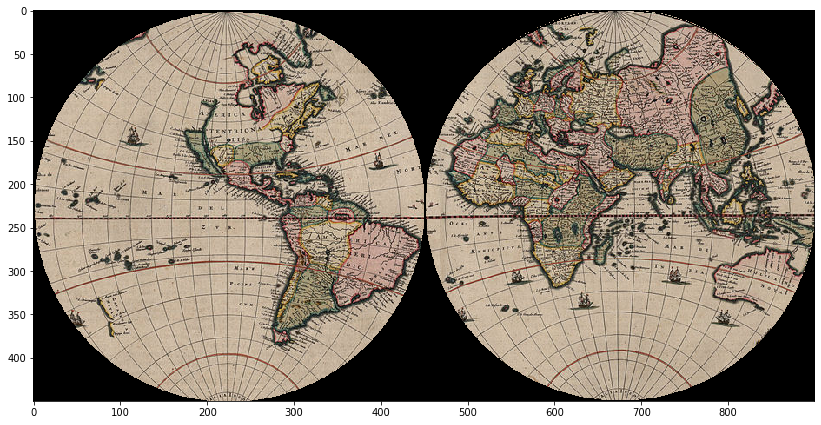

In [40]:
# Should be the original map, totally unchanged. 
test_img0 = generate_img(
    western=small_western_hemisphere, eastern=small_eastern_hemisphere, 
    n_rad=small_rad, 
    rot_mat=rotationMatrix(axis_vector=np.array([1, 0, 0]), angle=0.0)
    )
plt.figure(figsize=(14, 10))
plt.imshow(test_img0)

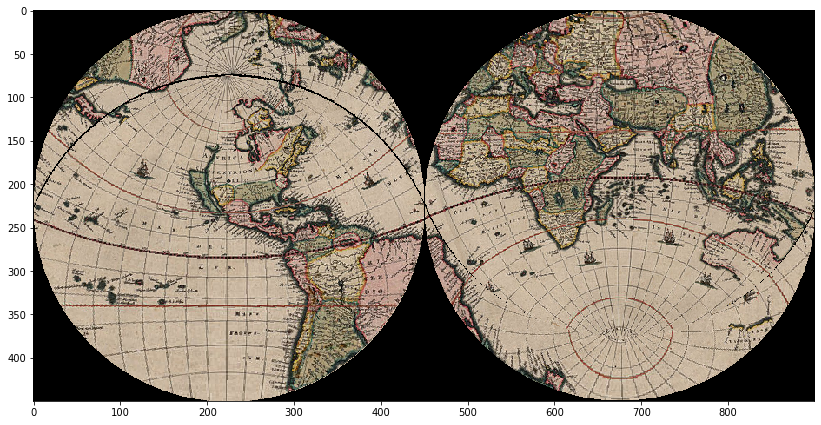

In [42]:
# Should be the original map rotated a bit.
test_img1 = generate_img(
    western=small_western_hemisphere, eastern=small_eastern_hemisphere, 
    n_rad=small_rad, 
    rot_mat=rotationMatrix(axis_vector=np.array([1, 0, 0]), angle=np.pi/8)
    )
plt.figure(figsize=(14, 10))
plt.imshow(test_img1)

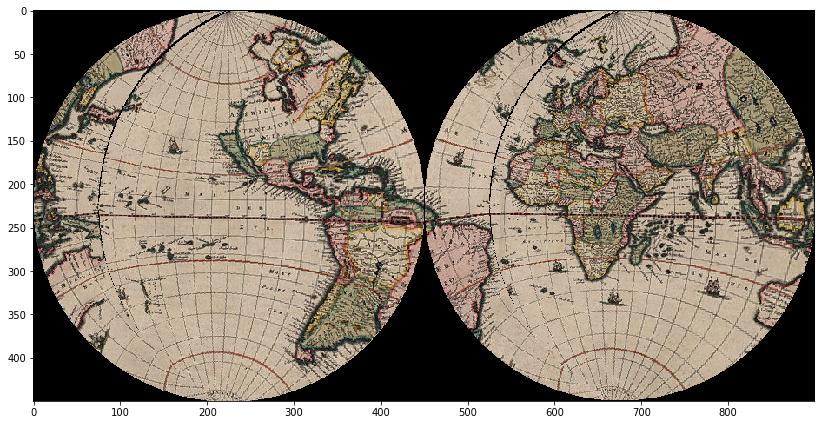

In [43]:
# Should be the original map rotated a bit.
test_img2 = generate_img(
    western=small_western_hemisphere, eastern=small_eastern_hemisphere, 
    n_rad=small_rad, 
    rot_mat=rotationMatrix(axis_vector=np.array([0, 1, 0]), angle=np.pi/8)
    )
plt.figure(figsize=(14, 10))
plt.imshow(test_img2)

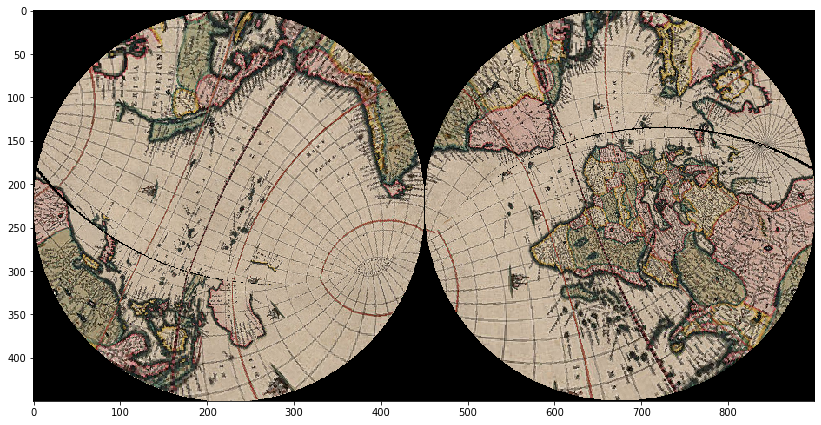

In [48]:
# Should be a random projection image, but perferctly valid.  When you get things wrong,
# you'll usually have things not linine up.  1/2 a hemisphere will be flipped or off. 
# Check that everythign lines up and that nothing appears twice too. 
# Copying this here just so I can 
test_img3 = generate_img(
    western=small_western_hemisphere, eastern=small_eastern_hemisphere, 
    n_rad=small_rad, 
    rot_mat=rotationMatrix(axis_vector=np.random.randn(3, 1).flatten(), angle=np.random.randn(1)[0])
    )
plt.figure(figsize=(14, 10))
plt.imshow(test_img3)

# Making GIFs

First I want to be able to make a smooth set of rotations.  

One way to do this is a repeating gif that constantly rotates at the same speed.  Not too tough.

Another way is to apply constant force, as though I'm actually rotating a globe.  This will look a bit more natural - the rotation will start slow and then end slow.  But I need a bit of math first.

I could do this w/ torques and stuff, but I'm pretty sure it's all still F = ma  / F/m = a, so I'll just do it w/ constant acceleration.  Will want constant acceleration and then constant decceleration.

In [49]:
def constant_acc_curve(n_steps):
    """Provides a constant accelaration / constant deceleration path from 0 to 1."""
    velocity = 0.0
    position = 0.0
    positions = [0.0]
    delta_v = 1.0 / (1.0 * n_steps)
    
    # What's the required accel to get it to go from 0 to 1 in n steps?
    for step_i in np.arange(n_steps):
        position += velocity
        
        if ((1.0*step_i) / (1.0*n_steps)) < 0.5:
            velocity += delta_v
        elif ((1.0*step_i) / (1.0*n_steps)) > 0.5:
            velocity -= delta_v
        
        positions += [position]
        
    # OK, whatever, I'll just divide by max rather than figure out constant.
    return [position / max(positions) for position in positions]

In [50]:
mycurve = constant_acc_curve(200)

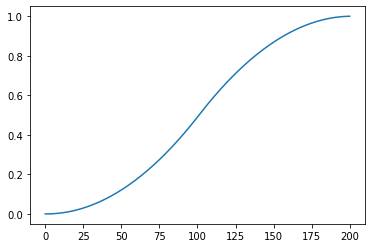

In [52]:
plt.plot(mycurve)

Ok.  So acceleration is constant.  Then velocity is like a pyramid.  So distance in first half is like $\int_x 2*v_max * x dx$ from 0 to 1/2.  This is c * x^2/2 - 0 = 2 * v_max * (1/2)^2 /2. This is v_max /4.  So I want 2 * v_max /4 = 1, so v_max = 2. 

In [ ]:
import imageio

In [53]:
def make_gif(
    filename,    
    western, eastern,
    radius,
    rot_mat_axis,
    n_images=50,
    seconds = 8.0    
):
    """Make a smooth gif doing a full rotation.
    Following [this example](https://stackoverflow.com/a/35943809). 

```
import imageio
with imageio.get_writer('/path/to/movie.gif', mode='I') as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
```"""
    make_transition_gif(
        filename,    
        western, eastern,
        radius,
        rot_mat_axis,
        rot_mat_angle = 2.0 * np.pi,
        n_images = n_images,
        seconds = seconds
    )
    
    
def make_repeating_gif(
    filename,        
    western, eastern,
    radius,
    rot_mat_axis,
    n_images=50,
    seconds = 8.0    
):
    """Make a repeating gif showing a rotation at constant speed"""
    angles = np.linspace(0, 2*np.pi, n_images)
    
    with imageio.get_writer(filename, mode='I', fps = ((1.0*n_images) / seconds)) as writer:
        for angle in angles:
            rot_mat = rotationMatrix(axis_vector=rot_mat_axis, angle=angle)
            image = generate_img(
                western=western, eastern=eastern, 
                n_rad=radius, 
                rot_mat=rot_mat
            )
            writer.append_data(image)    
    
      


def make_transition_gif(
    filename,    
    western, eastern,
    radius,
    rot_mat_axis,
    rot_mat_angle,
    n_images=10,
    seconds = 8.0
):
    """For one rotation matrix, make a gif going from standard map to
    a different position."""
    angles = [rot_mat_angle * angle for angle in constant_acc_curve(n_images)]
    
    with imageio.get_writer(filename, mode='I', fps = ((1.0*n_images) / seconds)) as writer:
        for angle in angles:
            rot_mat = rotationMatrix(axis_vector=rot_mat_axis, angle=angle)
            image = generate_img(
                western=western, eastern=eastern, 
                n_rad=radius, 
                rot_mat=rot_mat
            )
            writer.append_data(image)
            
def make_back_and_forth_gif(
    filename,    
    western, eastern,
    radius,
    rot_mat_axis,
    rot_mat_angle,
    n_images=10,
    seconds = 8.0
):
    """For one rotation matrix, make a gif going from standard map to
    a different position and back."""
    angles = [rot_mat_angle * angle for angle in constant_acc_curve(n_images)]
    angles_back = deepcopy(angles)
    angles_back.reverse()
    all_angles = angles + angles_back

    with imageio.get_writer(filename, mode='I', fps = ((2.0*n_images) / seconds)) as writer:
        for angle in all_angles:
            rot_mat = rotationMatrix(axis_vector=rot_mat_axis, angle=angle)
            image = generate_img(
                western=western, eastern=eastern, 
                n_rad=radius, 
                rot_mat=rot_mat
            )
            writer.append_data(image)

# Put Maps back in Setting

In [54]:
#small_western_hemisphere = get_hemisphere((370, 250), 225, base=small_cropped_blau)
#small_eastern_hemisphere = get_hemisphere((370, 720), 225, base=small_cropped_blau)
small_western_center = (370, 250)
small_eastern_center = (370, 720)


def put_images_in_frame(
    western_img, eastern_img, 
    cropped_base,
    radius,
    west_center, east_center
):
    # I want to put the images in the middle.
    us, vs = np.meshgrid(np.arange(-radius, radius), np.arange(-radius, radius))
    in_circle = [
        u**2 + v**2 < radius**2
        for u, v in zip(us, vs)
    ]
    us = us[in_circle]
    vs = vs[in_circle]
    
    new_full_img = deepcopy(cropped_base)
    
    #. this goes from center_u - radius to center_u + radius
    #. same for y.  
    new_full_img[west_center[0] + us, west_center[1] + vs, :] = western_img[radius+us, radius+vs]
    new_full_img[us + east_center[0], vs + east_center[1], :] = eastern_img[radius+us, radius+vs]

    return new_full_img

In [55]:
test_framed_img = put_images_in_frame(
    small_western_hemisphere, small_eastern_hemisphere,
    small_cropped_blau,
    radius=225,
    west_center=small_western_center, east_center=small_eastern_center
)

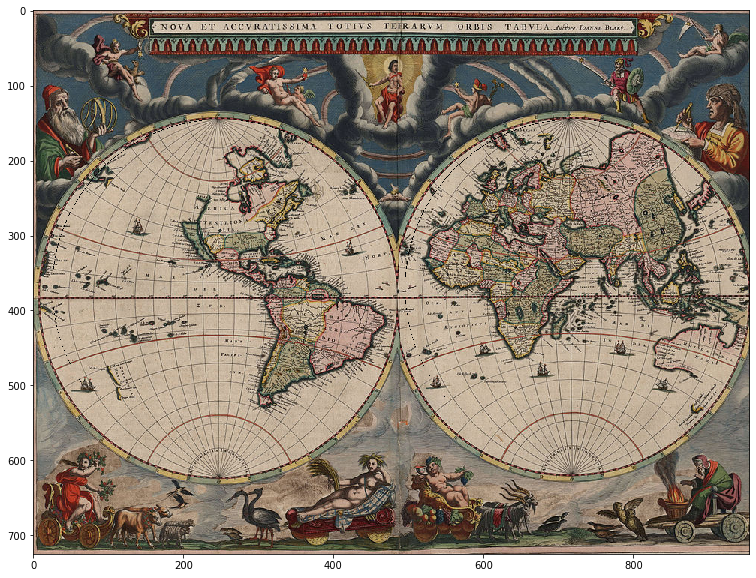

In [61]:
plt.figure(figsize=(14, 10))
plt.imshow(test_framed_img)

Did I get it right?


In [57]:
test_img_1.shape

(450, 900, 3)

In [64]:
test_framed_img_2 = put_images_in_frame(
    test_img3[:, 0:450, :], test_img3[:, 450:900, :],
    small_cropped_blau,
    radius=225,
    west_center=small_western_center, east_center=small_eastern_center
)

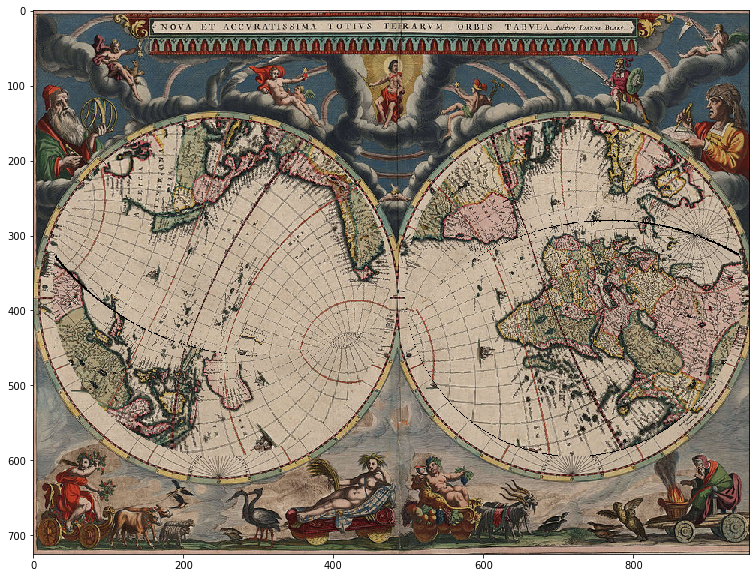

In [65]:
plt.figure(figsize=(14, 10))
plt.imshow(test_framed_img_2)

So it doesn't _really_ work.  I clearly am leaving off a chunk of the original at the bottom.  Probably need to lower the originals and increase the radius a bit.  I'll bet I originally did this to avoid the crease issues.  It might not look much better 